In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/yolov9-main

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1FsxtjdRhKCSS4b319zT5rcL3Dd5sOLs5/yolov9-main


In [2]:
!python --version

Python 3.11.13


In [ ]:
import cv2
import numpy as np
instance_path = "datasets/PhenoBench/train/plant_instances/05-26_00193_P0034119.png"
semantic_path = "datasets/PhenoBench/train/semantics/05-26_00193_P0034119.png"

instance_mask = cv2.imread(instance_path, cv2.IMREAD_UNCHANGED)
semantic_mask = cv2.imread(semantic_path, cv2.IMREAD_UNCHANGED)

print("Instance mask shape:", instance_mask.shape, "Unique vals:", np.unique(instance_mask))
print("Semantic mask shape:", semantic_mask.shape, "Unique vals:", np.unique(semantic_mask))

if semantic_mask.ndim == 3:
    print("Semantic mask channels:", semantic_mask.shape[2])
    semantic_mask_gray = semantic_mask[:, :, 0]
    print("Unique vals in semantic_mask_gray:", np.unique(semantic_mask_gray))

Instance mask shape: (1024, 1024) Unique vals: [   0  229  235  236  237  238  315  335  336  337  338  342  517 1263
 1265]
Semantic mask shape: (1024, 1024) Unique vals: [0 1 2 3]


In [ ]:
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train | wc -l
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/train/labels | wc -l

1407
1407


In [ ]:
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val | wc -l
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/valid/labels | wc -l

772
772


In [ ]:
import os
import json
import cv2
import numpy as np
from glob import glob
from tqdm import tqdm

# === User config ===
output_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations"
os.makedirs(output_dir, exist_ok=True)

# Base image and label directories
image_dirs = {
    "train": "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train",
    "val":   "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
}
label_dirs = {
    "train": "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/train/labels",
    "val":   "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/valid/labels"
}

class_names = ["crop", "weed"]

def convert_to_coco(split):
    image_dir = image_dirs[split]
    label_dir = label_dirs[split]

    image_paths = sorted(glob(os.path.join(image_dir, "*.png")) + glob(os.path.join(image_dir, "*.jpg")))
    images = []
    annotations = []
    ann_id = 0

    for img_id, img_path in enumerate(tqdm(image_paths, desc=f"[{split}] Processing images")):
        filename = os.path.basename(img_path)
        name = os.path.splitext(filename)[0]
        label_path = os.path.join(label_dir, f"{name}.txt")

        img = cv2.imread(img_path)
        if img is None:
            print(f"⚠️ Image load failed: {img_path}")
            continue
        height, width = img.shape[:2]

        images.append({
            "id": img_id,
            "file_name": filename,
            "width": width,
            "height": height
        })

        if not os.path.exists(label_path):
            continue

        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            if len(parts) < 7:
                continue

            try:
                cls_id = int(parts[0])
                coords = list(map(float, parts[1:]))

                if len(coords) % 2 != 0:
                    continue

                coords_np = np.array(coords).reshape(-1, 2)
                coords_np = np.clip(coords_np, 0, 1)
                abs_coords = (coords_np * np.array([width, height])).astype(np.float32)
                abs_coords_flat = abs_coords.flatten().tolist()

                if len(abs_coords) < 3:
                    continue

                x_min, y_min = abs_coords.min(axis=0)
                x_max, y_max = abs_coords.max(axis=0)
                bbox = [float(x_min), float(y_min), float(x_max - x_min), float(y_max - y_min)]
                area = float((x_max - x_min) * (y_max - y_min))

                annotations.append({
                    "id": ann_id,
                    "image_id": img_id,
                    "category_id": cls_id,
                    "segmentation": [abs_coords_flat],
                    "area": area,
                    "bbox": bbox,
                    "iscrowd": 0
                })
                ann_id += 1
            except Exception as e:
                print(f"❌ Error in {label_path}: {e}")
                continue

    coco_dict = {
        "info": {
            "description": f"PhenoBench {split} in COCO instance format"
        },
        "licenses": [],
        "images": images,
        "annotations": annotations,
        "categories": [
            {"id": i, "name": name, "supercategory": "plant"} for i, name in enumerate(class_names)
        ]
    }

    out_json = os.path.join(output_dir, f"instances_{split}.json")
    with open(out_json, "w") as f:
        json.dump(coco_dict, f)
    print(f"✅ Saved: {out_json} — {len(images)} images, {len(annotations)} instances")

# Run for both splits
convert_to_coco("train")
convert_to_coco("val")

[train] Processing images: 100%|██████████| 1407/1407 [21:03<00:00,  1.11it/s]


✅ Saved: /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_train.json — 1407 images, 23253 instances


[val] Processing images: 100%|██████████| 772/772 [11:15<00:00,  1.14it/s]


✅ Saved: /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json — 772 images, 11874 instances


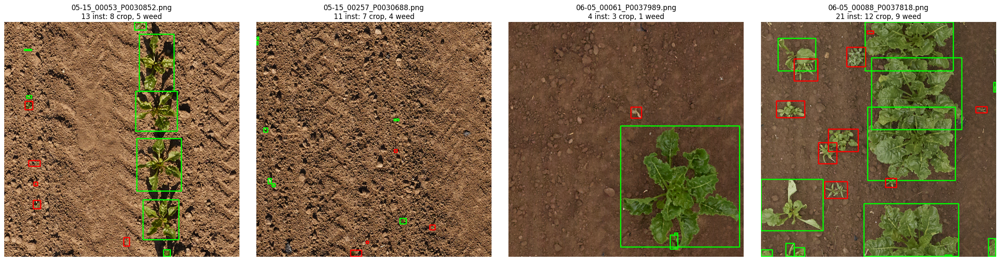

In [ ]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_train.json"

# --- Fixed Colors ---
CROP_COLOR = (0, 255, 0)   # Green
WEED_COLOR = (255, 0, 0)   # Red

def get_color(cls_id):
    return CROP_COLOR if cls_id == 0 else WEED_COLOR

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Pick 4 random images ---
random_img_ids = random.sample(list(image_id_map.keys()), 4)

fig, axes = plt.subplots(1, 4, figsize=(24, 6))

for i, img_id in enumerate(random_img_ids):
    filename = image_id_map[img_id]
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load: {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img.copy()

    anns = annotations_per_image.get(img_id, [])
    count_crop = 0
    count_weed = 0

    for ann in anns:
        cls_id = ann["category_id"]
        if cls_id == 0:
            count_crop += 1
        elif cls_id == 1:
            count_weed += 1

        x, y, w, h = ann["bbox"]
        x1, y1, x2, y2 = int(x), int(y), int(x + w), int(y + h)

        color = get_color(cls_id)
        cv2.rectangle(overlay, (x1, y1), (x2, y2), color, 3)

    axes[i].imshow(overlay)
    axes[i].set_title(f"{filename}\n{len(anns)} inst: {count_crop} crop, {count_weed} weed")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

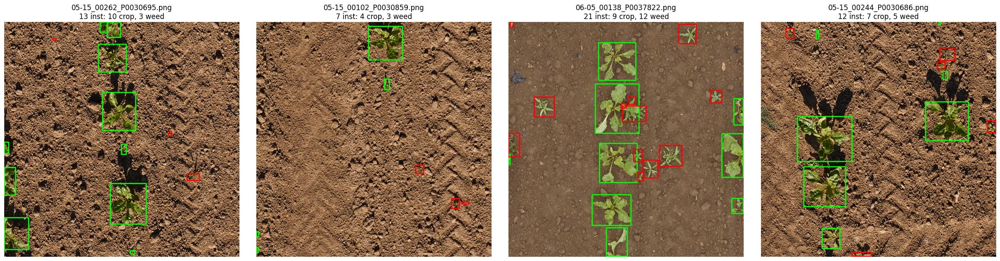

In [ ]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json"

# --- Fixed Colors ---
CROP_COLOR = (0, 255, 0)   # Green
WEED_COLOR = (255, 0, 0)   # Red

def get_color(cls_id):
    return CROP_COLOR if cls_id == 0 else WEED_COLOR

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Pick 4 random images ---
random_img_ids = random.sample(list(image_id_map.keys()), 4)

fig, axes = plt.subplots(1, 4, figsize=(24, 6))

for i, img_id in enumerate(random_img_ids):
    filename = image_id_map[img_id]
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load: {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img.copy()

    anns = annotations_per_image.get(img_id, [])
    count_crop = 0
    count_weed = 0

    for ann in anns:
        cls_id = ann["category_id"]
        if cls_id == 0:
            count_crop += 1
        elif cls_id == 1:
            count_weed += 1

        x, y, w, h = ann["bbox"]
        x1, y1, x2, y2 = int(x), int(y), int(x + w), int(y + h)

        color = get_color(cls_id)
        cv2.rectangle(overlay, (x1, y1), (x2, y2), color, 3)

    axes[i].imshow(overlay)
    axes[i].set_title(f"{filename}\n{len(anns)} inst: {count_crop} crop, {count_weed} weed")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# STEP 1: Install compatible PyTorch (2.0.1 + CUDA 11.7)
!pip install torch==2.0.1 torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

# STEP 2: Install OpenMMLab tools
!pip install -U openmim
!mim install "mmengine>=0.7.4"
!mim install "mmcv==2.1.0"

# STEP 3: Clone MMDetection & install
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

In [ ]:
# STEP 4: Final check
!python -c "import torch; import mmcv; import mmdet; print('PyTorch:', torch.__version__); print('MMCV:', mmcv.__version__); print('MMDet:', mmdet.__version__)"

PyTorch: 2.0.1+cu117
MMCV: 2.1.0
MMDet: 3.3.0


In [ ]:
!pip install numpy==1.24.4

In [ ]:
!ls mmdetection/projects/EfficientDet/configs/

efficientdet_effb0_bifpn_8xb16-crop512-300e_coco.py
efficientdet_effb3_bifpn_8xb16-crop896-300e_coco-90cls.py
efficientdet_effb3_bifpn_8xb16-crop896-300e_coco.py
efficientdet_pheno.py
tensorflow


In [ ]:
custom_cfg = """
_base_ = 'efficientdet_effb3_bifpn_8xb16-crop896-300e_coco.py'

visualizer = dict(
    type='Visualizer',
    vis_backends=[
        dict(type='LocalVisBackend'),  # no Tensorboard backend
        # ✅ DO NOT include 'TensorboardVisBackend'
    ],
    name='visualizer'
)

# Custom classes
dataset_type = 'CocoDataset'
metainfo = dict(classes=('crop', 'weed'))
num_classes = 2

# Paths
data_root = '/content/gdrive/MyDrive/yolov9-main/datasets/'
train_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_train.json'
val_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_val.json'
train_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/train/'
val_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/val/'

# Data loaders
train_dataloader = dict(
    batch_size=8,
    num_workers=8,
    dataset=dict(
        type=dataset_type,
        metainfo=metainfo,
        data_root=data_root,
        ann_file=train_ann,
        data_prefix=dict(img=train_img)
    )
)
val_dataloader = dict(
    batch_size=8,
    num_workers=8,
    dataset=dict(
        type=dataset_type,
        metainfo=metainfo,
        data_root=data_root,
        ann_file=val_ann,
        data_prefix=dict(img=val_img)
    )
)
test_dataloader = val_dataloader

# Model
#model = dict(bbox_head=dict(num_classes=num_classes))
model = dict(bbox_head=dict(num_classes=num_classes), test_cfg=dict(score_thr=0.3))

# Evaluation: use mAP for detection
val_evaluator = dict(type='CocoMetric', ann_file=val_ann, metric=['bbox'], classwise=True)
test_evaluator = val_evaluator

# === Training
train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=20, val_interval=1)

val_cfg = dict(type='ValLoop')
test_cfg = dict(type='TestLoop')

# Optimizer
optim_wrapper = dict(
    optimizer=dict(type='SGD', lr=0.001, momentum=0.9, weight_decay=0.0001),
)
optimizer_config = dict(grad_clip=dict(max_norm=35, norm_type=2))

# === Scheduler
param_scheduler = [
    dict(type='LinearLR', start_factor=0.001, by_epoch=False, begin=0, end=880),
    dict(type='MultiStepLR', begin=0, end=20, by_epoch=True, milestones=[15, 18], gamma=0.1)
]

# Logging and checkpointing
default_hooks = dict(
    logger=dict(type='LoggerHook', interval=2),
    checkpoint=dict(
        type='CheckpointHook',
        interval=2,
        save_best='coco/bbox_mAP',
        rule='greater'
    ),
)

# Output path
work_dir = '/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet_outputs/efficientdet_crop_weed'

# Load pretrained COCO model
load_from = 'https://download.openmmlab.com/mmdetection/v3.0/efficientdet/efficientdet_effb3_bifpn_8xb16-crop896-300e_coco/efficientdet_effb3_bifpn_8xb16-crop896-300e_coco_20230223_122457-e6f7a833.pth'
"""

with open('mmdetection/projects/EfficientDet/configs/efficientdet_pheno.py', 'w') as f:
    f.write(custom_cfg)

In [ ]:
!python mmdetection/tools/train.py \
  mmdetection/projects/EfficientDet/configs/efficientdet_pheno.py --amp

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 15:23:59 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 242282905
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [ ]:
!python mmdetection/tools/test.py mmdetection/projects/EfficientDet/configs/efficientdet_pheno.py mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.pth

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 17:11:03 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1264808871
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA

In [ ]:
!python mmdetection/tools/test.py \
  mmdetection/projects/EfficientDet/configs/efficientdet_pheno.py \
  mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.pth \
  --out result.pkl

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 18:19:16 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 304716766
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [ ]:
import pickle

with open('result.pkl', 'rb') as f:
    results = pickle.load(f)
#print(results[0])

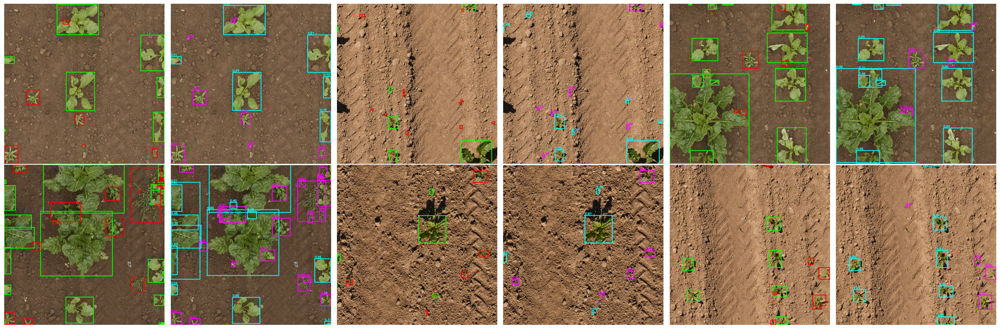

In [ ]:
import os
import json
import random
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json"
result_pkl_path = "result.pkl"  # path to saved result.pkl file

# --- Fixed Colors ---
GT_COLORS = {0: (0, 255, 0),   # Green (Crop)
             1: (255, 0, 0)}   # Red (Weed)

PRED_COLORS = {0: (0, 255, 255),  # Cyan (Crop)
               1: (255, 0, 255)}  # Magenta (Weed)

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Load pred results ---
with open(result_pkl_path, 'rb') as f:
    pred_results = pickle.load(f)

# Build map from image filename to pred result
pred_map = {os.path.basename(res['img_path']): res for res in pred_results}

# --- Choose N random images from pred_map keys ---
N = 6
random_filenames = random.sample(list(pred_map.keys()), N)

# Calculate subplot layout (2 cols per image: GT + Pred)
cols = 6
rows = (N * 2 + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = axes.flatten()

def draw_bboxes(img, bboxes, labels, scores=None, title=None, is_gt=True):
    overlay = img.copy()
    for i, (bbox, label) in enumerate(zip(bboxes, labels)):
        color = GT_COLORS[label] if is_gt else PRED_COLORS[label]
        x1, y1, x2, y2 = map(int, bbox)
        cv2.rectangle(overlay, (x1, y1), (x2, y2), color, 3)
        if scores is not None and not is_gt:
            score_text = f"{scores[i]:.2f}"
            cv2.putText(overlay, score_text, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
    return overlay

for idx, filename in enumerate(random_filenames):
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load image {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Find GT annotations
    img_id = next(k for k, v in image_id_map.items() if v == filename)
    gt_anns = annotations_per_image.get(img_id, [])
    gt_bboxes = [[x, y, x+w, y+h] for ann in gt_anns for x, y, w, h in [ann['bbox']]]
    gt_labels = [ann['category_id'] for ann in gt_anns]

    # Draw GT
    gt_img = draw_bboxes(img, gt_bboxes, gt_labels, title=f"GT: {filename}", is_gt=True)

    # Draw Predictions
    pred = pred_map[filename]
    pred_bboxes = pred['pred_instances']['bboxes'].numpy()
    pred_labels = pred['pred_instances']['labels'].numpy()
    pred_scores = pred['pred_instances']['scores'].numpy()

    # Filter low confidence predictions
    thresh = 0.3
    keep = pred_scores >= thresh
    pred_bboxes = pred_bboxes[keep]
    pred_labels = pred_labels[keep]
    pred_scores = pred_scores[keep]

    pred_img = draw_bboxes(img, pred_bboxes, pred_labels, pred_scores, title=f"Pred: {filename}", is_gt=False)

    # Plot GT and Pred
    axes[idx * 2].imshow(gt_img)
    axes[idx * 2].axis('off')
    axes[idx * 2 + 1].imshow(pred_img)
    axes[idx * 2 + 1].axis('off')

# Hide unused axes
for j in range(len(random_filenames) * 2, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from mmdet.apis import init_detector, inference_detector
import mmcv

# Config and checkpoint paths
config_file = 'mmdetection/projects/EfficientDet/configs/efficientdet_pheno.py'
checkpoint_file = 'mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.pth'

# Initialize the model
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or 'cpu'

# Image path
img = '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00122_P0037991.png'

# Run inference
result = inference_detector(model, img)
print(result)

Loads checkpoint by local backend from path: mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.pth
<DetDataSample(

    META INFORMATION
    pad_shape: (896, 896)
    ori_shape: (1024, 1024)
    batch_input_shape: (896, 896)
    img_shape: (896, 896)
    scale_factor: (0.875, 0.875)
    img_path: '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00122_P0037991.png'
    img_id: 0

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
        ) at 0x77fd917f2e90>
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
        ) at 0x77fd917e1090>
    pred_i

Loads checkpoint by local backend from path: mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.pth


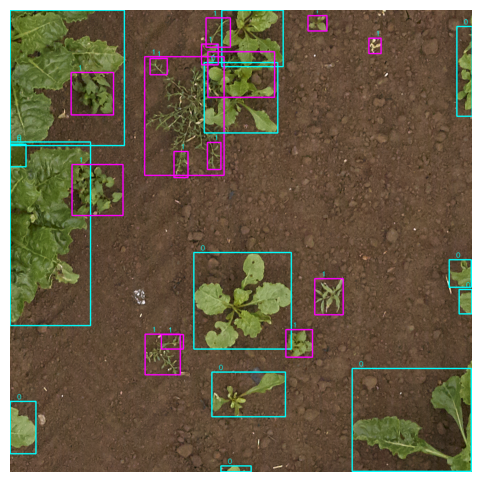

In [ ]:
from mmdet.apis import init_detector, inference_detector
import mmcv
import cv2
import matplotlib.pyplot as plt
import torch

# Class labels
CLASS_LABELS = ["0", "1"]

PRED_COLORS = {0: (255, 255, 0),  # Cyan (Crop)
               1: (255, 0, 255)}  # Magenta (Weed)

# Config and checkpoint paths
config_file = 'mmdetection/projects/EfficientDet/configs/efficientdet_pheno.py'
checkpoint_file = 'mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.pth'

# Initialize the model
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or 'cpu'

def draw_bbox_with_label(img, bbox, label, color=(0, 0, 255), thickness=2):
    xmin, ymin, xmax, ymax = map(int, bbox)
    # Draw rectangle
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, thickness)
    # Put label text
    cv2.putText(
        img, label, (xmin + 15, ymin - 5),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 1, cv2.LINE_AA
    )

# Image path
img_path = '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00122_P0037991.png'
img = cv2.imread(img_path)
if img is None:
    raise Exception("Image not found or unreadable")

# Run inference
results = inference_detector(model, img_path)

# Access the prediction results from the DetDataSample object
pred_instances = results.pred_instances

CONF_THRESHOLD = 0.3
img_with_bbox = img.copy()

# Draw boxes and labels
# pred_instances.bboxes, pred_instances.scores, and pred_instances.labels are tensors
for i in range(len(pred_instances.bboxes)):
    score = pred_instances.scores[i]
    if score < CONF_THRESHOLD:
        continue
    bbox = pred_instances.bboxes[i].tolist() # Convert tensor to list for drawing
    label_id = pred_instances.labels[i].item() # Get integer label ID from tensor
    class_name = CLASS_LABELS[label_id] # Use label_id directly as index since classes are 0-indexed

    draw_bbox_with_label(img_with_bbox, bbox, class_name, color=PRED_COLORS[label_id])

# Show result
img_with_bbox_rgb = cv2.cvtColor(img_with_bbox, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6, 6))
plt.axis('off')
plt.imshow(img_with_bbox_rgb)
plt.show()

In [3]:
!pip install onnx onnxscript

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 105.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 69.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 164.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.3/159.3 kB 29.4 MB/s eta 0:00:00
  Attempting uninstall: ml_dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.18.0 requires ml-dtypes<0.5.0,>=0.4.0, but you have ml-dtypes 0.5.4 which is incompatible.


In [5]:
import torch

In [6]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

cuda


In [ ]:
dummy_input = torch.randn(1, 3, 896, 896).to(device)
onnx_model_path = "mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.onnx"
torch.onnx.export(
    model,
    dummy_input,
    onnx_model_path,
    opset_version=13,
    input_names=["input"],
    output_names=["boxes", "labels", "scores"],
    dynamic_axes={
        "input": {0: "batch_size", 2: "height", 3: "width"},
        "boxes": {0: "num_boxes"},
        "labels": {0: "num_boxes"},
        "scores": {0: "num_boxes"},
    },
    do_constant_folding=True,
)
print(f"ONNX export {onnx_model_path} completed successfully!")

============= Diagnostic Run torch.onnx.export version 2.0.1+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================

ONNX export mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.onnx completed successfully!


In [7]:
!pip install onnxruntime-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.6/252.6 MB 7.2 MB/s eta 0:00:00


In [11]:
import onnxruntime
import numpy as np
import cv2
import torch
import os
import random

# Load image and preprocess
img_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00122_P0037991.png"

mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

img = cv2.imread(img_path)
img_resized = cv2.resize(img, (896, 896))
img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

# Run inference
session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name
outputs = session.run(None, {input_name: img_input})

# outputs is a list, often like [boxes, scores, keypoints]
print("Output:", [o.shape for o in outputs])

Output: [(1, 18, 112, 112), (1, 18, 56, 56), (1, 18, 28, 28), (1, 18, 14, 14), (1, 18, 7, 7), (1, 36, 112, 112), (1, 36, 56, 56), (1, 36, 28, 28), (1, 36, 14, 14), (1, 36, 7, 7)]


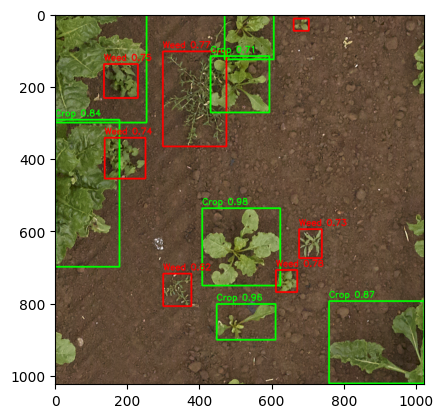

In [9]:
import torch
from torchvision.ops import nms
import numpy as np
import cv2
from matplotlib import pyplot as plt

# 2. CONFIG PARAMETERS
STRIDES = [8, 16, 32, 64, 128]
# octave_base_scale=4, scales_per_octave=3
OCTAVE_SCALES = [2**0, 2**(1/3), 2**(2/3)]
RATIOS = [1.0, 0.5, 2.0]
NUM_ANCHORS = 9
NUM_CLASSES = 2
CONF_THR = 0.6
IOU_THR = 0.3

all_boxes, all_scores, all_labels = [], [], []

for i, stride in enumerate(STRIDES):
    cls_map = outputs[i][0]      # (18, H, W)
    reg_map = outputs[i + 5][0]  # (36, H, W)
    C, H, W = cls_map.shape

    # 1. Sigmoid first to avoid numerical instability
    cls_scores_map = 1 / (1 + np.exp(-cls_map))

    # 2. Reshape to (H, W, 9, C) to align with meshgrid flatten
    cls_scores = cls_scores_map.reshape(9, 2, H, W).transpose(2, 3, 0, 1).reshape(-1, 2)
    reg_deltas = reg_map.reshape(9, 4, H, W).transpose(2, 3, 0, 1).reshape(-1, 4)

    # 3. Anchor Generation
    y, x = np.meshgrid(np.arange(H), np.arange(W), indexing='ij')
    # grid_x/y shape (H, W) -> flatten to (H*W) -> repeat 9 times to match (H, W, 9)
    cx = np.repeat((x.flatten() + 0.5) * stride, 9)
    cy = np.repeat((y.flatten() + 0.5) * stride, 9)

    # Base WH for 9 anchors
    base_wh = []
    # Ratios are the inner loop in MMDetection's AnchorGenerator
    for r in RATIOS:
        for s in OCTAVE_SCALES:
            base_wh.append([4 * stride * s / np.sqrt(r), 4 * stride * s * np.sqrt(r)])

    anchor_wh = np.tile(np.array(base_wh), (H * W, 1))

    # 4. Decode
    px = reg_deltas[:, 0] * anchor_wh[:, 0] + cx
    py = reg_deltas[:, 1] * anchor_wh[:, 1] + cy
    pw = np.exp(reg_deltas[:, 2]) * anchor_wh[:, 0]
    ph = np.exp(reg_deltas[:, 3]) * anchor_wh[:, 1]

    boxes = np.stack([px - pw/2, py - ph/2, px + pw/2, py + ph/2], axis=-1)

    # 5. Filter
    scores = np.max(cls_scores, axis=1)
    mask = scores > 0.05 # Use lower threshold for NMS to work better
    if np.any(mask):
        all_boxes.append(boxes[mask])
        all_scores.append(scores[mask])
        all_labels.append(np.argmax(cls_scores[mask], axis=1))

# --- 6. SOFT-NMS REPLACEMENT ---
if all_boxes:
    boxes = np.concatenate(all_boxes)
    scores = np.concatenate(all_scores)
    labels = np.concatenate(all_labels)

    # Multi-class NMS: offset boxes so classes don't compete
    offsets = labels.astype(np.float32) * 4096
    boxes_for_nms = boxes + offsets[:, None]

    keep = nms(torch.tensor(boxes_for_nms).float(), torch.tensor(scores).float(), IOU_THR)

    # Scale back to original image using rx and ry
    h_orig, w_orig = img.shape[:2]
    rx, ry = w_orig / 896, h_orig / 896

    for idx in keep:
        if scores[idx] < CONF_THR: continue

        # FIX 1: Apply rx to Width (x1, x2) and ry to Height (y1, y2)
        x1, y1, x2, y2 = boxes[idx]
        x1, x2 = x1 * rx, x2 * rx
        y1, y2 = y1 * ry, y2 * ry

        # FIX 2: Correct integer casting for the drawing function
        b = [int(x1), int(y1), int(x2), int(y2)]

        # Color: Green for Crop (0), Red for Weed (1)
        color = (0, 255, 0) if labels[idx] == 0 else (0, 0, 255)

        # Draw with thicker lines
        cv2.rectangle(img, (b[0], b[1]), (b[2], b[3]), color, 3)
        label_text = f"{'Crop' if labels[idx]==0 else 'Weed'} {scores[idx]:.2f}"
        cv2.putText(img, label_text, (b[0], b[1]-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

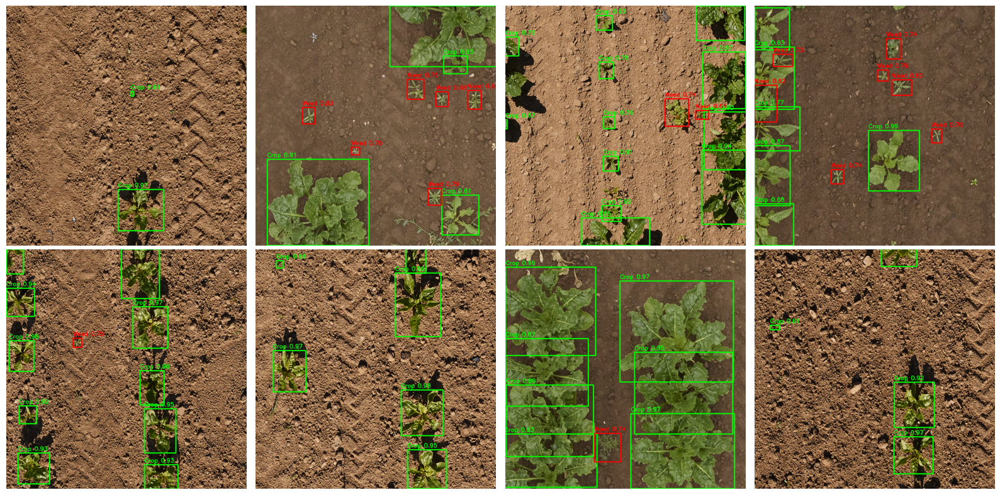

In [13]:
mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name

STRIDES = [8, 16, 32, 64, 128]
# octave_base_scale=4, scales_per_octave=3
OCTAVE_SCALES = [2**0, 2**(1/3), 2**(2/3)]
RATIOS = [1.0, 0.5, 2.0]
NUM_ANCHORS = 9
NUM_CLASSES = 2
CONF_THR = 0.6
IOU_THR = 0.3

# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/"

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)
    img_resized = cv2.resize(img, (896, 896))
    img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs = session.run(None, {input_name: img_input})

    all_boxes, all_scores, all_labels = [], [], []

    for i, stride in enumerate(STRIDES):
        cls_map = outputs[i][0]      # (18, H, W)
        reg_map = outputs[i + 5][0]  # (36, H, W)
        C, H, W = cls_map.shape

        # 1. Sigmoid first to avoid numerical instability
        cls_scores_map = 1 / (1 + np.exp(-cls_map))

        # 2. Reshape to (H, W, 9, C) to align with meshgrid flatten
        cls_scores = cls_scores_map.reshape(9, 2, H, W).transpose(2, 3, 0, 1).reshape(-1, 2)
        reg_deltas = reg_map.reshape(9, 4, H, W).transpose(2, 3, 0, 1).reshape(-1, 4)

        # 3. Anchor Generation
        y, x = np.meshgrid(np.arange(H), np.arange(W), indexing='ij')
        # grid_x/y shape (H, W) -> flatten to (H*W) -> repeat 9 times to match (H, W, 9)
        cx = np.repeat((x.flatten() + 0.5) * stride, 9)
        cy = np.repeat((y.flatten() + 0.5) * stride, 9)

        # Base WH for 9 anchors
        base_wh = []
        # Ratios are the inner loop in MMDetection's AnchorGenerator
        for r in RATIOS:
            for s in OCTAVE_SCALES:
                base_wh.append([4 * stride * s / np.sqrt(r), 4 * stride * s * np.sqrt(r)])

        anchor_wh = np.tile(np.array(base_wh), (H * W, 1))

        # 4. Decode
        px = reg_deltas[:, 0] * anchor_wh[:, 0] + cx
        py = reg_deltas[:, 1] * anchor_wh[:, 1] + cy
        pw = np.exp(reg_deltas[:, 2]) * anchor_wh[:, 0]
        ph = np.exp(reg_deltas[:, 3]) * anchor_wh[:, 1]

        boxes = np.stack([px - pw/2, py - ph/2, px + pw/2, py + ph/2], axis=-1)

        # 5. Filter
        scores = np.max(cls_scores, axis=1)
        mask = scores > 0.05 # Use lower threshold for NMS to work better
        if np.any(mask):
            all_boxes.append(boxes[mask])
            all_scores.append(scores[mask])
            all_labels.append(np.argmax(cls_scores[mask], axis=1))

    # --- 6. SOFT-NMS REPLACEMENT ---
    if all_boxes:
        boxes = np.concatenate(all_boxes)
        scores = np.concatenate(all_scores)
        labels = np.concatenate(all_labels)

        # Multi-class NMS: offset boxes so classes don't compete
        offsets = labels.astype(np.float32) * 4096
        boxes_for_nms = boxes + offsets[:, None]

        keep = nms(torch.tensor(boxes_for_nms).float(), torch.tensor(scores).float(), IOU_THR)

        # Scale back to original image using rx and ry
        h_orig, w_orig = img.shape[:2]
        rx, ry = w_orig / 896, h_orig / 896

        for idx in keep:
            if scores[idx] < CONF_THR: continue

            # FIX 1: Apply rx to Width (x1, x2) and ry to Height (y1, y2)
            x1, y1, x2, y2 = boxes[idx]
            x1, x2 = x1 * rx, x2 * rx
            y1, y2 = y1 * ry, y2 * ry

            # FIX 2: Correct integer casting for the drawing function
            b = [int(x1), int(y1), int(x2), int(y2)]

            # Color: Green for Crop (0), Red for Weed (1)
            color = (0, 255, 0) if labels[idx] == 0 else (0, 0, 255)

            # Draw with thicker lines
            cv2.rectangle(img, (b[0], b[1]), (b[2], b[3]), color, 3)
            label_text = f"{'Crop' if labels[idx]==0 else 'Weed'} {scores[idx]:.2f}"
            cv2.putText(img, label_text, (b[0], b[1]-10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()